# Análisis de las votaciones en el Festival de la Canción de Eurovisión (1956-2023)

In [166]:
import os
import re
import json
import math
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.ops import nearest_points
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import altair as alt
import networkx as nx
import nx_altair as nxa
import openchord as ocd

In [167]:
#Set altair dark theme
alt.themes.enable('dark')

ThemeRegistry.enable('dark')

## 1. Importar los datos

### 1.1. Concursantes

In [168]:
contestants_df = pd.read_csv('./Data/contestants_preprocessed.csv')
contestants_df.head()

,year,to_country_id,to_country,performer,song,place_contest,sf_num,running_final,running_sf,place_final,...,place_sf,points_sf,points_tele_final,points_jury_final,points_tele_sf,points_jury_sf,composers,lyricists,lyrics,youtube_url
0,1956,ch,Switzerland,Lys Assia,Refrain,2.0,NaN,2.0,NaN,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Georg Benz Stahl,NaN,"(Refrain d'amour...) Refrain, couleur du ciel...",https://youtube.com/watch?v=IyqIPvOkiRk
1,1956,nl,Netherlands,Jetty Paerl,De Vogels Van Holland,2.0,NaN,1.0,NaN,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Cor Lemaire,Annie M. G. Schmidt,De vogels van Holland zijn zo muzikaal Ze lere...,https://youtube.com/watch?v=u45UQVGRVPA
2,1956,be,Belgium,Fud Leclerc,Messieurs Les Noyés De La Seine,2.0,NaN,3.0,NaN,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Jacques Say;Jean Miret,Robert Montal,Messieurs les noyés de la Seine Ouvrez-moi les...,https://youtube.com/watch?v=U9O3sqlyra0
3,1956,de,Germany,Walter Andreas Schwarz,Im Wartesaal Zum Großen Glück,2.0,NaN,4.0,NaN,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Walter Andreas Schwarz,NaN,"Es gibt einen Hafen, da fährt kaum ein Schiff ...",https://youtube.com/watch?v=BDNARIDnmTc
4,1956,fr,France,Mathé Altéry,Le Temps Perdu,2.0,NaN,5.0,NaN,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,André Lodge,Rachèle Thoreau,"Chante, carillon Le chant du temps perdu Chant...",https://youtube.com/watch?v=dm1L0XyikKI


In [169]:
contestants_df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1734 entries, 0 to 1733
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   year               1734 non-null   int64  
 1   to_country_id      1734 non-null   object 
 2   to_country         1734 non-null   object 
 3   performer          1734 non-null   object 
 4   song               1731 non-null   object 
 5   place_contest      1678 non-null   float64
 6   sf_num             640 non-null    float64
 7   running_final      1398 non-null   float64
 8   running_sf         605 non-null    float64
 9   place_final        1397 non-null   float64
 10  points_final       1385 non-null   float64
 11  place_sf           605 non-null    float64
 12  points_sf          605 non-null    float64
 13  points_tele_final  181 non-null    float64
 14  points_jury_final  181 non-null    float64
 15  points_tele_sf     212 non-null    float64
 16  points_jury_sf     212 n

In [170]:
#Remove duplicates
print(contestants_df.duplicated().sum())
contestants_df.drop_duplicates(inplace=True)

0


Algunos países tienen inconsistencias en relación con sus códigos o nombres entre las entradas. Podemos ver, por ejemplo, que hay países que no tienen un código de dos letras asociado. 

In [171]:
contestants_df[['to_country_id', 'to_country']].drop_duplicates()

,to_country_id,to_country
0,ch,Switzerland
1,nl,Netherlands
2,be,Belgium
3,de,Germany
4,fr,France
...,...,...
1513,Russia,Russia
1568,Australia,Australia
1584,Ukraine,Ukraine
1637,mk,North MacedoniaN.Macedonia


In [172]:
#Data Cleaning
contestants_df.loc[contestants_df['to_country']=='Andorra','to_country_id'] = 'ad'
contestants_df.loc[contestants_df['to_country_id']=='mk','to_country'] = 'North Macedonia'
contestants_df.loc[contestants_df['to_country']=='Czechia','to_country'] = 'Czech Republic'
contestants_df.loc[contestants_df['to_country']=='Bosnia & Herzegovina','to_country'] = 'Bosnia and Herzegovina'

A continuación se va a añadir el idioma de las canciones para completar este conjunto de datos.

In [173]:
results_df = pd.read_csv('./Data/Every_Eurovision_Result_Ever.csv')
#results_df['Year'] = pd.to_datetime(results_df['Year'], format='%Y')
#Capitalize each word in song title to follow 
#the same standard than in contestant df
results_df['Song'] = results_df['Song'].str.title()
results_df

,Song,Artist,Country,Year,Language,Grand Final Place,Grand Final Points,Semifinal,Semifinal Place,Semifinal Points
0,Le Plus Beau Jour De Ma Vie,Mony Marc,Belgium,1956,French,NaN,NaN,No Semifinal,NaN,NaN
1,Messieurs Les Noyés De La Seine,Fud Leclerc,Belgium,1956,French,NaN,NaN,No Semifinal,NaN,NaN
2,Il Est Là,Danny Dauberson,France,1956,French,NaN,NaN,No Semifinal,NaN,NaN
3,Le Temps Perdu,Mathé Altéry,France,1956,French,NaN,NaN,No Semifinal,NaN,NaN
4,Im Wartesaal Zum Großen Glück,Walter Andreas Schwarz,Germany,1956,German,NaN,NaN,No Semifinal,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
1716,Eaea,Blanca Paloma,Spain,2023,Spanish,17,100,AQ,AQ,AQ
1717,Tattoo,Loreen,Sweden,2023,English,1,583,1,2,135
1718,Watergun,Remo Forrer,Switzerland,2023,English,20,92,1,7,97
1719,Heart Of Steel,Tvorchi,Ukraine,2023,"English, Ukrainian",6,243,AQ,AQ,AQ


In [174]:
contestants_df = contestants_df.merge(results_df[['Country', 'Year', 'Language', 'Song']], left_on=['year', 'to_country', 'song'],
                                      right_on=['Year', 'Country', 'Song'], how='left')
#contestants_df.head(15)

Se va añadir también una columna adicional con información sobre si los países se clasificaron o no en la final

In [175]:
contestants_df['finalist'] = 0
contestants_df.loc[~contestants_df['place_final'].isna(), 'finalist'] = 1

Habría que eliminar 2020

In [176]:
contestants_df = contestants_df[contestants_df['year']!=2020]

In [177]:
#Convert year to datetime
contestants_df['year'] = pd.to_datetime(contestants_df['year'], format='%Y')

Add classification group

In [178]:
def classification_group(final_position):
    if final_position == 1:
        classification = 'winner'
    elif final_position <= 5: 
        classification = 'Top5'
    elif final_position <= 10: 
        classification = 'Top10'
    elif math.isnan(final_position) or final_position == '_':
        classification = 'Semifinalist'
    else:
        classification = 'Finalist'
    return classification 

In [179]:
contestants_df['classification'] = contestants_df['place_final'].apply(classification_group)
#contestants_df.head()

### 1.2. Votos

In [180]:
country_votes_df = pd.read_csv('./Data/votes.csv')
country_votes_df.head()

,year,round,from_country_id,to_country_id,from_country,to_country,total_points,tele_points,jury_points
0,1957,final,at,nl,at,nl,6,NaN,NaN
1,1957,final,at,fr,at,fr,0,NaN,NaN
2,1957,final,at,dk,at,dk,0,NaN,NaN
3,1957,final,at,lu,at,lu,3,NaN,NaN
4,1957,final,at,de,at,de,0,NaN,NaN


In [181]:
country_votes_df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51354 entries, 0 to 51353
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   year             51354 non-null  int64  
 1   round            51354 non-null  object 
 2   from_country_id  51354 non-null  object 
 3   to_country_id    51354 non-null  object 
 4   from_country     51354 non-null  object 
 5   to_country       51354 non-null  object 
 6   total_points     51354 non-null  int64  
 7   tele_points      11741 non-null  float64
 8   jury_points      11715 non-null  float64
dtypes: float64(2), int64(2), object(5)
memory usage: 16.2 MB


In [182]:
# Import country-geographical group mapping
with open('./Data/country_groups_mapping.json', 'r') as file:
    country_group_mapping = json.load(file)

# Add geographical group 
country_votes_df['from_country_group'] = country_votes_df['from_country'].replace(country_group_mapping)
country_votes_df['to_country_group'] = country_votes_df['to_country'].replace(country_group_mapping)
country_votes_df.head()

,year,round,from_country_id,to_country_id,from_country,to_country,total_points,tele_points,jury_points,from_country_group,to_country_group
0,1957,final,at,nl,at,nl,6,NaN,NaN,Western Europe,Western Europe
1,1957,final,at,fr,at,fr,0,NaN,NaN,Western Europe,Western Europe
2,1957,final,at,dk,at,dk,0,NaN,NaN,Western Europe,Northern Europe
3,1957,final,at,lu,at,lu,3,NaN,NaN,Western Europe,Western Europe
4,1957,final,at,de,at,de,0,NaN,NaN,Western Europe,Western Europe


### 1.3. Canciones (2009-2023)

El archivo original de kaggle se ha tenido que codificar en `UTF-8` para poder ser leído por pandas. La conversión se ha realizado en `Notepad++` y el archivo que se proporciona al equipo docente será el modificado. 

También se han sustituido las comas que había en los títulos de las canciones por espacios, para que no se identifiquen como campos separados. En los casos en los que las canciones estaban en más de una lengua, que también se habían representado por comas, se han sustituido por el idioma principal o por la etiqueta 'English + others'.

In [183]:
songs_df = pd.read_csv('./Data/song_data.csv', na_values=['-', 'unknown'])
songs_df = songs_df[songs_df['year']!=2020]
songs_df.head()

,year,semi_final,semi_draw_position,final_draw_position,country,artist_name,song_name,language,style,direct_qualifier_10,...,final_jury_votes,final_place,final_total_points,semi_place,semi_televote_points,semi_jury_points,semi_total_points,favourite_10,race,host_10
0,2023,1.0,1.0,20.0,Norway,Alessandra,Queen of Kings,English,Pop,0.0,...,11.0,5.0,268.0,6.0,102.0,NaN,102.0,0,NaN,0
1,2023,1.0,2.0,NaN,Malta,The Busker,Dance (Our Own Party),English,Pop,NaN,...,NaN,NaN,NaN,15.0,3.0,NaN,3.0,0,NaN,0
2,2023,1.0,3.0,5.0,Serbia,Luke Black,Samo mi se spava,English + others,Pop,0.0,...,6.0,24.0,30.0,10.0,37.0,NaN,37.0,0,NaN,0
3,2023,1.0,4.0,NaN,Latvia,Sudden Lights,Aija,English,Rock,NaN,...,NaN,NaN,NaN,11.0,34.0,NaN,34.0,0,NaN,0
4,2023,1.0,5.0,2.0,Portugal,Mimicat,Ai coração,Portuguese,Pop,0.0,...,9.0,23.0,59.0,9.0,74.0,NaN,74.0,0,NaN,0


In [184]:
songs_df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 565 entries, 0 to 564
Data columns (total 44 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   year                   565 non-null    int64  
 1   semi_final             485 non-null    float64
 2   semi_draw_position     485 non-null    float64
 3   final_draw_position    358 non-null    float64
 4   country                565 non-null    object 
 5   artist_name            565 non-null    object 
 6   song_name              565 non-null    object 
 7   language               565 non-null    object 
 8   style                  565 non-null    object 
 9   direct_qualifier_10    356 non-null    float64
 10  gender                 565 non-null    object 
 11  main_singers           565 non-null    int64  
 12  age                    0 non-null      float64
 13  selection              0 non-null      float64
 14  key                    475 non-null    object 
 15  BPM   

In [185]:
#Create a classification column to group songs according to their position
songs_df['classification'] = songs_df['final_draw_position'].apply(classification_group)
songs_df.head()

,year,semi_final,semi_draw_position,final_draw_position,country,artist_name,song_name,language,style,direct_qualifier_10,...,final_place,final_total_points,semi_place,semi_televote_points,semi_jury_points,semi_total_points,favourite_10,race,host_10,classification
0,2023,1.0,1.0,20.0,Norway,Alessandra,Queen of Kings,English,Pop,0.0,...,5.0,268.0,6.0,102.0,NaN,102.0,0,NaN,0,Finalist
1,2023,1.0,2.0,NaN,Malta,The Busker,Dance (Our Own Party),English,Pop,NaN,...,NaN,NaN,15.0,3.0,NaN,3.0,0,NaN,0,Semifinalist
2,2023,1.0,3.0,5.0,Serbia,Luke Black,Samo mi se spava,English + others,Pop,0.0,...,24.0,30.0,10.0,37.0,NaN,37.0,0,NaN,0,Top5
3,2023,1.0,4.0,NaN,Latvia,Sudden Lights,Aija,English,Rock,NaN,...,NaN,NaN,11.0,34.0,NaN,34.0,0,NaN,0,Semifinalist
4,2023,1.0,5.0,2.0,Portugal,Mimicat,Ai coração,Portuguese,Pop,0.0,...,23.0,59.0,9.0,74.0,NaN,74.0,0,NaN,0,Top5


### 1.4. Apuestas

In [186]:
bets_df = pd.read_csv('./Data/betting_offices.csv')
bets_df['year'] = pd.to_datetime(bets_df['year'], format='%Y')
bets_df.head()

,betting_bm_id,betting_sc_id,betting_name,betting_score,year,performer,song,page_url,contest_round,country_name,country_code
0,5,220,BET365,2.10,2015-01-01,Måns Zelmerlöw,Heroes,/eurovision/2015/sweden,final,Sweden,Sweden
1,4,153,UNIBET,2.00,2015-01-01,Måns Zelmerlöw,Heroes,/eurovision/2015/sweden,final,Sweden,Sweden
2,18,139,YOUWIN,2.38,2015-01-01,Måns Zelmerlöw,Heroes,/eurovision/2015/sweden,final,Sweden,Sweden
3,15,131,BOYLESPORTS,2.25,2015-01-01,Måns Zelmerlöw,Heroes,/eurovision/2015/sweden,final,Sweden,Sweden
4,21,124,CORAL,2.10,2015-01-01,Måns Zelmerlöw,Heroes,/eurovision/2015/sweden,final,Sweden,Sweden


## 2.  Análisis de datos

### Customizar la paleta de colores

Inspiration for the palette: 

- Eurovision 2022: https://www.behance.net/gallery/143410695/Eurovision-2022-Brand-Identity
- Eurovision 2024: https://eurovision.tv/story/eurovision-2024-theme-art-revealed 

Colorblind safety palettes: https://www.nceas.ucsb.edu/sites/default/files/2022-06/Colorblind%20Safe%20Color%20Schemes.pdf

In [187]:
print(px.colors.qualitative.Pastel)

['rgb(102, 197, 204)', 'rgb(246, 207, 113)', 'rgb(248, 156, 116)', 'rgb(220, 176, 242)', 'rgb(135, 197, 95)', 'rgb(158, 185, 243)', 'rgb(254, 136, 177)', 'rgb(201, 219, 116)', 'rgb(139, 224, 164)', 'rgb(180, 151, 231)', 'rgb(179, 179, 179)']


In [188]:
#eurovision_palette = ['#8a3ffc', '#33b1ff', '#007d79', '#ff7eb6', '#fa4d56', '#fff1f1',
#              '#6fdc8c', '#4589ff', '#d12771', 'd2a106', '#08bdba', '#bae6ff',
#              '#ba4e00', '#d4bbff']

#eurovision_palette = ["#0cc0aa", "#bcebeb", "#57b230", "#9bf97e", "#5ca6d3", "#d77cdd", 
#                      "#658bfb", "#f2daff", "#fd3fbe", "#ba92b0", "#e6faa2", "#89975b"]

#set3 palette
#eurovision_palette = ['#8dd3c7', '#ffffb3', '#bebada', '#fb8072', '#80b1d3', '#fdb462',
#                      '#b3de69', '#fccde5', '#d9d9d9', '#bc80bd', '#ccebc5', '#ffed6f']

eurovision_palette = ["#D2B4DE", '#15CAB6', '#F6B53D', '#EF8A5A', '#E85E76', '#696CB5', '#BABABA', '#156082', '#F4F6FA']
eurovision_cont_palette = ['#007d79','#15CAB6','#d9fbfb']

eurovision_palette_df = pd.DataFrame({
    'x': range(9),
    'color': eurovision_palette
})

alt.Chart(eurovision_palette_df).mark_point(
    filled=True,
    size=100
).encode(
    x='x',
    color=alt.Color('color').scale(None)
)

alt.Chart(...)

### 2.1. Eurovision in a nutshell

#### _Si podéis aprender idiomas, sobre todo inglés_ -M. Rajoy

In [189]:
common_languages = contestants_df.groupby(['Language'], as_index=False).size()
common_languages.sort_values('size', ascending=False).head(n=8)

,Language,size
16,English,567
46,French,94
51,German,68
14,Dutch,49
85,Spanish,46
61,Italian,43
72,Portuguese,41
87,Swedish,29


In [190]:
#Find entries with multiple languages being English one of them
def contains_english(language_str):
    return bool(re.search(r'\bEnglish\b', language_str)) and ',' in language_str
# Identify rows where 'English' is in the list of languages along with other languages
bilingual_entries = contestants_df['Language'].apply(lambda x: contains_english(str(x)))
contestants_df.loc[bilingual_entries, 'Language'] = 'English + other language'

In [191]:
common_languages_ls = ['English', 'French', 'German','German','Italian',
                       'Spanish', 'Portuguese', 'English + other language']
minoritary_languages_ls = contestants_df[~contestants_df['Language'].isin(common_languages_ls)]['Language'].unique()
# Replace minoritary languages with "Other Languages"
contestants_df['Language_red'] = contestants_df['Language'].copy()
contestants_df.loc[contestants_df['Language'].isin(minoritary_languages_ls), 'Language_red'] = 'Other Languages'

In [192]:
contestants_language_df = contestants_df.groupby(['year', 'Language_red'], as_index=False).size()
contestants_language_df

,year,Language_red,size
0,1956-01-01,French,6
1,1956-01-01,German,2
2,1956-01-01,Italian,2
3,1956-01-01,Other Languages,2
4,1957-01-01,English,1
...,...,...,...
360,2023-01-01,English + other language,1
361,2023-01-01,French,1
362,2023-01-01,Other Languages,19
363,2023-01-01,Portuguese,2


In [199]:
alt.Chart(contestants_language_df).mark_area().encode(
    x=alt.X("year:T", axis=alt.Axis(format='%Y')).title('Year'),
    y=alt.Y('size:Q').title('Number of entries'),
    color=alt.Color("Language_red:N", scale=alt.Scale(range=eurovision_palette)).title('Language')).properties(
        width=500,
        height=400
).configure_axis(
    labelFontSize=20,
    titleFontSize=20
).configure_legend(
titleFontSize=15,
labelFontSize=15
) 

alt.Chart(...)

#### Evolución del número de participantes y puntos otorgados

Cuando se crea el concurso en 1956, los países participantes representaban 2 canciones cada uno, no neseramiente interpretadas por el mismo cantante. Por eso veremos que el número de participantes no va a coincidir con el de canciones. 

In [200]:
## Number of participants per year
participants_year = contestants_df.groupby('year', as_index=False)['to_country_id'].nunique()
participants_year.columns = ['year', 'n_participants']

alt.Chart(participants_year).mark_bar(color=eurovision_palette[0]).encode(
    alt.Y('n_participants').title('Number of participant countries'),
    alt.X("year:T", axis=alt.Axis(format='%Y')).title('Years'),
).properties(
        width=800,
        height=400
)

alt.Chart(...)

In [201]:
## Number of participants and points per year

#Number of participants
participants_year = contestants_df.groupby('year', as_index=False)['to_country_id'].nunique()
participants_year.columns = ['year', 'n_participants']


#Total points
points_year = contestants_df.pivot_table(index='year', 
                                      values=['points_final'], 
                                      aggfunc='sum').stack().reset_index()

points_year.columns = ['year', 'source', 'points']
points_year.loc[points_year['points'] == 0, 'points'] = np.nan

#Combine
contestants_year = participants_year.merge(points_year, on='year')

base = alt.Chart(contestants_year).encode(alt.X("year:T", axis=alt.Axis(format='%Y')).title('Years'))

bar = base.mark_bar(color=eurovision_palette[0]).encode(
    alt.Y('n_participants').title('Number of participant countries')
    )

line = base.mark_line(color='#F6B53D').encode(
    alt.Y('points').title('Total points')
    )

alt.layer(bar, line).resolve_scale(
    y='independent'
).properties(
    width=600,
    height=400
)

alt.LayerChart(...)

In [202]:
## Find wether contestants classified for the final

participants_year = contestants_df.groupby(['year', 'finalist'], as_index=False)['to_country_id'].nunique()
participants_year.columns = ['year', 'finalist', 'n_participants']

alt.Chart(participants_year).mark_bar().encode(
    alt.Y('n_participants').title('Number of participant countries'),
    alt.X("year:T", axis=alt.Axis(format='%Y')).title('Years'),
    color=alt.Color("finalist:N", scale=alt.Scale(range=eurovision_palette)).title('Classified for the final')
).properties(
        width=800,
        height=400
)

alt.Chart(...)

In [211]:
## Number of participants and points per year

#Number of participants
participants_year = contestants_df.groupby(['year', 'finalist'], as_index=False)['to_country_id'].nunique()
participants_year.columns = ['year', 'finalist', 'n_participants']
participants_year.loc[participants_year['finalist']==0,'finalist'] = 'No'
participants_year.loc[participants_year['finalist']==1,'finalist'] = 'Yes'

#Total points
points_year = contestants_df.pivot_table(index='year', 
                                      values=['points_final'], 
                                      aggfunc='sum').stack().reset_index()

points_year.columns = ['year', 'source', 'points']
points_year.loc[points_year['points'] == 0, 'points'] = np.nan

#Combine
contestants_year = participants_year.merge(points_year, on='year')

base = alt.Chart(contestants_year).encode(alt.X("year:T", axis=alt.Axis(format='%Y')).title('Years'))

bar = base.mark_bar().encode(
    alt.Y('n_participants').title('Number of participant countries'),
    color=alt.Color("finalist:N", scale=alt.Scale(range=eurovision_palette)).title('Classified for the final')
    )

line = base.mark_line(color='#F6B53D', size=4).encode(
    alt.Y('points').title('Total points')    
    )

alt.layer(bar, line).resolve_scale(
    y='independent'
).properties(
    width=500,
    height=400
).configure_axis(
    labelFontSize=20,
    titleFontSize=20
).configure_legend(
titleFontSize=15,
labelFontSize=15,
orient='bottom'
) 

alt.LayerChart(...)

#### Trayectoria de cada país en el concurso

In [33]:
selection = alt.selection_point(fields=['to_country'], empty=False)
color = alt.condition(
    selection,
    #alt.Color('to_country:N', scale=alt.Scale(range=eurovision_palette)).legend(None),
    alt.Color('to_country:N', scale=alt.Scale(range=eurovision_palette)).legend(None),
    #alt.value('lightgray')
    alt.value('rgba(211, 211, 211, 0)')
)

scatter = alt.Chart(contestants_df).mark_line().encode(
    x=alt.X("year:T", axis=alt.Axis(format='%Y')).title('Years'),
    y=alt.Y('place_contest',scale=alt.Scale(domain=(45, 1))).title('Place in contest'),
    color=color,
    tooltip=['points_final:N', 'song:N', 'performer:N']
).properties(
    width=600,
    height=400
)

legend = alt.Chart(contestants_df).mark_point().encode(
    alt.Y('to_country:N', title='Country').axis(orient='right'),
    color=color
).add_params(
    selection
)

scatter | legend


alt.HConcatChart(...)

### ¿Qué país es el más pesado? 

In [213]:
## Number of entries per country
entries_country = contestants_df.groupby(['to_country'], as_index=False)['to_country'].value_counts()
entries_country.columns = ['country',  'n_entries']
entries_country = entries_country.sort_values(by='n_entries', ascending=False)

In [214]:
# Import worldmap metadata
url = "./Data/world.geo.json"
gdf_ne = gpd.read_file(url)  # zipped shapefile
gdf_ne = gdf_ne[["name", 'geometry', 'continent', 'type']]
gdf_ne.columns = ["country", 'geometry', 'continent', 'type']

In [215]:
# define a pointer selection
click_state = alt.selection_point(fields=["country"])

#select europe
worldmap = gdf_ne[(gdf_ne['continent'] == 'Europe') | (gdf_ne['continent'] == 'Asia') | 
                 (gdf_ne['continent'] == 'Africa')]

# Filter out overseas territories of France
worldmap = worldmap[(worldmap['type'] != "Dependency")]

# create a choropleth map using a lookup transform
# define a condition on the opacity encoding depending on the selection
choropleth = (
    alt.Chart(worldmap)
    .mark_geoshape()
    .transform_lookup(
        lookup="country", from_=alt.LookupData(entries_country, "country", ["country", "n_entries"])
    )
    .encode(
        color=alt.Color("n_entries:Q").scale(range=['#15CAB6','#d9fbfb']),
        opacity=alt.condition(click_state, alt.value(1), alt.value(0.2)),
        tooltip=["country:N", "n_entries:Q"],
    ).project(
        type= 'mercator',
    scale= 200,                          # Magnify
    center= [0,50],                     # [lon, lat]
    clipExtent= [[-100, 0], [500, 300]],    # [[left, top], [right, bottom]]
    ).properties(
        width=400,
        height=300
)
)

#Add Australia to the map
worldmap_australia = gdf_ne[gdf_ne['country'] == 'Australia']
# create a choropleth map for Australia
choropleth_australia = (
    alt.Chart(worldmap_australia)
    .mark_geoshape()
    .transform_lookup(
        lookup="country", from_=alt.LookupData(entries_country, "country", ["country", "n_entries"])
    )
    .encode(
        color=alt.Color("n_entries:Q").scale(range=['#15CAB6','#d9fbfb'], reverse=True),
        opacity=alt.condition(click_state, alt.value(1), alt.value(0.2)),
        tooltip=["country:N", "n_entries:Q"],
    ).project(
        type='mercator',
        scale= 100,                          # Magnify
        center=[210, 35],                     # [lon, lat]
        clipExtent= [[-100, 0], [500, 300]],    # [[left, top], [right, bottom]]
    ).properties(
        width=400,
        height=300
)
)

(alt.layer(choropleth,choropleth_australia)).add_params(click_state).interactive()

alt.LayerChart(...)

**ISSUE**: geopandas is not working in Streamlit. We will have to make some workaround

 https://github.com/streamlit/streamlit/issues/1002

In [216]:
# define a pointer selection
click_state = alt.selection_point(fields=["country"])

# create a choropleth map using a lookup transform
# define a condition on the opacity encoding depending on the selection
europe_url = "https://raw.githubusercontent.com/asolbas/eurovision-dataviz/main/Data/europe_map.geojson"
worldmap = alt.Data(url=europe_url, format=alt.DataFormat(property='features',type='json'))

choropleth = (
    alt.Chart(worldmap)
    .mark_geoshape()
    .transform_lookup(
        lookup="properties.country", from_=alt.LookupData(entries_country, "country", ["country", "n_entries"])
    )
    .encode(
        color=alt.Color("n_entries:Q").scale(range=eurovision_cont_palette, reverse=True),
        opacity=alt.condition(click_state, alt.value(1), alt.value(0.2)),
        tooltip=["country:N", "n_entries:Q"],
    ).project(
        type= 'mercator',
    scale= 200,                          # Magnify
    center= [0,50],                     # [lon, lat]
    clipExtent= [[-100, 0], [500, 300]],    # [[left, top], [right, bottom]]
    ).properties(
        width=400,
        height=300
)
)

#Add Australia to the map
australia_url = "https://raw.githubusercontent.com/asolbas/eurovision-dataviz/main/Data/australia_map.geojson"
worldmap_australia = alt.Data(url=australia_url, format=alt.DataFormat(property='features',type='json'))
# create a choropleth map for Australia
choropleth_australia = (
    alt.Chart(worldmap_australia).mark_geoshape(
    ).transform_lookup(
        lookup="properties.country", from_=alt.LookupData(entries_country, "country", ["country", "n_entries"])
    ).encode(
        color=alt.Color("n_entries:Q").scale(range=eurovision_cont_palette, reverse=True),
        opacity=alt.condition(click_state, alt.value(1), alt.value(0.2)),
        tooltip=["country:N", "n_entries:Q"],
    ).project(
        type='mercator',
        scale= 100,                          # Magnify
        center=[210, 35],                     # [lon, lat]
        clipExtent= [[-100, 0], [500, 300]],    # [[left, top], [right, bottom]]
    ).properties(
        width=400,
        height=300
)
)

(alt.layer(choropleth,choropleth_australia)).add_params(click_state).interactive()

alt.LayerChart(...)

### Combine entry map with points per country

In [224]:
click_state = alt.selection_point(fields=['country'])
color = alt.condition(
    click_state,
    alt.Color('country:N', scale=alt.Scale(range=eurovision_palette)).legend(None),
    alt.value('rgba(211, 211, 211, 0)')
)

contestants_df['country'] = contestants_df['to_country']
points_plot = alt.Chart(contestants_df).mark_line(point=True).encode(
    x=alt.X("year:T", axis=alt.Axis(format='%Y')).title('Years'),
    y=alt.Y('place_contest',scale=alt.Scale(domain=(45, 1))).title('Place in contest'),
    color=color,
    tooltip=['points_final:N', 'song:N', 'performer:N']
).properties(
    width=500,
    height=300
)

legend = alt.Chart(contestants_df).mark_point().encode(
    alt.Y('country:N', title='Country').axis(orient='right'),
    color=color
).add_params(
    click_state
)


# create a choropleth map using a lookup transform
# define a condition on the opacity encoding depending on the selection
europe_url = "https://raw.githubusercontent.com/asolbas/eurovision-dataviz/main/Data/europe_map.geojson"
worldmap = alt.Data(url=europe_url, format=alt.DataFormat(property='features',type='json'))

choropleth = (
    alt.Chart(worldmap)
    .mark_geoshape()
    .transform_lookup(
        lookup="properties.country", from_=alt.LookupData(entries_country, "country", ["country", "n_entries"])
    )
    .encode(
        color=alt.Color("n_entries:Q").title('Number of entries').scale(range=eurovision_cont_palette, reverse=True),
        opacity=alt.condition(click_state, alt.value(1), alt.value(0.2)),
        tooltip=["country:N", "n_entries:Q"],
    )
    .project(
        type= 'mercator',
    scale= 200,                          # Magnify
    center= [-60,70],                     # [lon, lat]
    clipExtent= [[-100, 0], [500, 300]],    # [[left, top], [right, bottom]]
    ).properties(
        width=400,
        height=300
)
)

#Add Australia to the map
australia_url = "https://raw.githubusercontent.com/asolbas/eurovision-dataviz/main/Data/australia_map.geojson"
worldmap_australia = alt.Data(url=australia_url, format=alt.DataFormat(property='features',type='json'))
# create a choropleth map for Australia
choropleth_australia = (
    alt.Chart(worldmap_australia).mark_geoshape(
    ).transform_lookup(
        lookup="properties.country", from_=alt.LookupData(entries_country, "country", ["country", "n_entries"])
    ).encode(
        color=alt.Color("n_entries:Q").title('Number of entries').scale(range=eurovision_cont_palette, reverse=True),
        opacity=alt.condition(click_state, alt.value(1), alt.value(0.2)),
        tooltip=["country:N", "n_entries:Q"],
    ).project(
        type='mercator',
        scale= 100,                          # Magnify
        center=[100, 70],                     # [lon, lat]
        clipExtent= [[-100, 0], [500, 300]],    # [[left, top], [right, bottom]]
    ).properties(
        width=400,
        height=300
)
)

(alt.layer(choropleth,choropleth_australia) & points_plot).add_params(click_state).configure_axis(
    labelFontSize=20,
    titleFontSize=20
).configure_legend(
titleFontSize=15,
labelFontSize=15
) 

alt.VConcatChart(...)

### 2.2. Geopolitics in Eurovision

In [39]:
country_votes_filter_df = country_votes_df[country_votes_df['round']=='final'][['year', 'from_country', 'to_country', 'total_points']].dropna()
country_votes_filter_df = country_votes_filter_df.groupby(['from_country', 'to_country'], as_index=False)['total_points'].sum()
country_votes_filter_df = country_votes_filter_df.merge(contestants_df[['to_country_id', 'to_country']].drop_duplicates(), how='left',
                                                        left_on='from_country', right_on='to_country_id').drop('to_country_id',axis=1)
country_votes_filter_df.columns = ['from_country', 'to_country', 'total_points', 'from_country_name']
country_votes_filter_df = country_votes_filter_df.merge(contestants_df[['to_country_id', 'to_country']].drop_duplicates(), how='left',
                                                        left_on='to_country', right_on='to_country_id').drop('to_country_id',axis=1)
country_votes_filter_df.columns = ['from_country', 'to_country', 'total_points', 'from_country_name', 'to_country_name']
country_votes_filter_df.dropna(inplace=True)
country_votes_filter_df.head()

,from_country,to_country,total_points,from_country_name,to_country_name
0,ad,al,0,Andorra,Albania
1,ad,am,0,Andorra,Armenia
2,ad,at,0,Andorra,Austria
3,ad,az,7,Andorra,Azerbaijan
4,ad,ba,0,Andorra,Bosnia and Herzegovina


In [40]:
#Normalized graph by total number of points given &
# percentage of points given to country

#Calculate percentage points a country has given to other countries trough its history
country_total_points = country_votes_filter_df.groupby('from_country',as_index=False)['total_points'].sum()
country_total_points.columns = ['from_country', 'overall_points_from']
country_votes_filter_df = country_votes_filter_df.merge(country_total_points)
country_votes_filter_df['norm_points_from'] = country_votes_filter_df['total_points'] / country_votes_filter_df['overall_points_from']
country_votes_filter_df['pct_points_from'] = country_votes_filter_df['norm_points_from'] * 100
country_votes_filter_df.sort_values('pct_points_from').tail()

,from_country,to_country,total_points,from_country_name,to_country_name,overall_points_from,norm_points_from,pct_points_from
564,cy,gr,394,Cyprus,Greece,2668,0.147676,14.767616
533,cs,mk,27,Serbia & Montenegro,North Macedonia,174,0.155172,15.517241
14,ad,es,60,Andorra,Spain,348,0.172414,17.241379
1502,ma,de,10,Morocco,Germany,58,0.172414,17.241379
1517,ma,tr,12,Morocco,Turkey,58,0.206897,20.689655


In [41]:
#Calculate percentage points a country has receiven by others trough its history
country_total_points = country_votes_filter_df.groupby('to_country',as_index=False)['total_points'].sum()
country_total_points.columns = ['to_country', 'overall_points_to']
country_votes_filter_df = country_votes_filter_df.merge(country_total_points)
country_votes_filter_df['norm_points_to'] = country_votes_filter_df['total_points'] / country_votes_filter_df['overall_points_to']
country_votes_filter_df['pct_points_to'] = country_votes_filter_df['norm_points_to'] * 100
country_votes_filter_df.sort_values('pct_points_to').tail()

,from_country,to_country,total_points,from_country_name,to_country_name,overall_points_from,norm_points_from,pct_points_from,overall_points_to,norm_points_to,pct_points_to
2205,mk,me,16,North Macedonia,Montenegro,1566,0.010217,1.021711,81,0.197531,19.753086
2215,si,me,17,Slovenia,Montenegro,2030,0.008374,0.837438,81,0.209877,20.987654
2178,am,me,20,Armenia,Montenegro,1218,0.016420,1.642036,81,0.246914,24.691358
2349,mt,sk,20,Malta,Slovakia,2469,0.008100,0.810045,42,0.476190,47.619048
2300,it,ma,7,Italy,Morocco,2457,0.002849,0.284900,7,1.000000,100.000000


### Who are the winners of Eurovision?

In [225]:
## Number of wins per country
wins_country = contestants_df[contestants_df['place_contest']==1.0].groupby(['country'], as_index=False)['country'].value_counts()
wins_country.columns = ['country',  'n_wins']
wins_country = wins_country.merge(contestants_df['country'], on='country', how='right').fillna(0).drop_duplicates()
wins_country['n_wins'].unique()

array([1., 5., 2., 3., 7., 0., 4.])

In [43]:
# define a pointer selection
click_state = alt.selection_point(fields=["country"])

choropleth = (
    alt.Chart(worldmap)
    .mark_geoshape()
    .transform_lookup(
        lookup="properties.country", from_=alt.LookupData(wins_country, "country", ["country", "n_wins"])
    )
    .encode(
        color=alt.Color("n_wins:Q").scale(range=eurovision_cont_palette, reverse=True).title('Number of wins'),
        opacity=alt.condition(click_state, alt.value(1), alt.value(0.2)),
        tooltip=["country:N", "n_wins:Q"],
    )
    .project(
        type= 'mercator',
    scale= 200,                          # Magnify
    center= [-60,70],                     # [lon, lat]
    clipExtent= [[-100, 0], [500, 300]],    # [[left, top], [right, bottom]]
    ).properties(
        width=400,
        height=300
)
)

#Add Australia to the map
australia_url = "https://raw.githubusercontent.com/asolbas/eurovision-dataviz/main/Data/australia_map.geojson"
worldmap_australia = alt.Data(url=australia_url, format=alt.DataFormat(property='features',type='json'))
# create a choropleth map for Australia
choropleth_australia = (
    alt.Chart(worldmap_australia).mark_geoshape(
    ).transform_lookup(
        lookup="properties.country", from_=alt.LookupData(wins_country, "country", ["country", "n_wins"])
    ).encode(
        color=alt.Color("n_wins:Q").scale(range=eurovision_cont_palette, reverse=True).title('Number of wins'),
        opacity=alt.condition(click_state, alt.value(1), alt.value(0.2)),
        tooltip=["country:N", "n_wins:Q"],
    ).project(
        type='mercator',
        scale= 100,                          # Magnify
        center=[100, 70],                     # [lon, lat]
        clipExtent= [[-100, 0], [500, 300]],    # [[left, top], [right, bottom]]
    ).properties(
        width=400,
        height=300
)
)

# create a bar chart with a similar condition on the opacity encoding.
bars = (
    alt.Chart(
        wins_country.nlargest(11, "n_wins"), title="Top ESC 11 countries"
    )
    .mark_bar()
    .encode(
        x="n_wins",
        opacity=alt.condition(click_state, alt.value(1), alt.value(0.2)),
        color="n_wins",
        y=alt.Y("country").sort("-x"),
    )
)

(alt.layer(choropleth,choropleth_australia) & bars).add_params(click_state)

alt.VConcatChart(...)

### Who voted who the most?

In [44]:
selected_country = 'Cyprus'
country_votes_filter_df[country_votes_filter_df['from_country_name']==selected_country]

alt.Chart(
        country_votes_filter_df[country_votes_filter_df['from_country_name']==selected_country].nlargest(
            5, "pct_points_from"), title="Most voted countries"
    ).mark_bar().encode(
        x=alt.X("pct_points_from").title('Points given (percentage)'),
        y=alt.Y("to_country_name").title('Country').sort("-x"),
    )

alt.Chart(...)

In [45]:
selected_country = 'Cyprus'
country_votes_filter_df[country_votes_filter_df['to_country_name']==selected_country]

alt.Chart(
        country_votes_filter_df[country_votes_filter_df['to_country_name']==selected_country].nlargest(
            5, "pct_points_to"), title="Most points received by"
    ).mark_bar().encode(
        x=alt.X("pct_points_to").title('Points received (percentage)'),
        y=alt.Y("from_country_name").title('Country').sort("-x"),
    )

alt.Chart(...)

In [238]:
# define a pointer selection
click_state = alt.selection_point(fields=["country"], toggle=False)
europe_url = "https://raw.githubusercontent.com/asolbas/eurovision-dataviz/main/Data/europe_map.geojson"
worldmap = alt.Data(url=europe_url, format=alt.DataFormat(property='features',type='json'))
choropleth = (
    alt.Chart(worldmap)
    .mark_geoshape()
    .transform_lookup(
        lookup="properties.country", from_=alt.LookupData(wins_country, "country", ["country", "n_wins"])
    )
    .encode(
        color=alt.Color("n_wins:Q").scale(range=eurovision_cont_palette, reverse=True).title('Number of wins'),
        opacity=alt.condition(click_state, alt.value(1), alt.value(0.2)),
        tooltip=["country:N", "n_wins:Q"],
    )
    .project(
        type= 'mercator',
    scale= 200,                          # Magnify
    center= [-60,70],                     # [lon, lat]
    clipExtent= [[-100, 0], [500, 300]],    # [[left, top], [right, bottom]]
    ).properties(
        width=400,
        height=300
)
)

#Add Australia to the map
australia_url = "https://raw.githubusercontent.com/asolbas/eurovision-dataviz/main/Data/australia_map.geojson"
worldmap_australia = alt.Data(url=australia_url, format=alt.DataFormat(property='features',type='json'))
# create a choropleth map for Australia
choropleth_australia = (
    alt.Chart(worldmap_australia).mark_geoshape(
    ).transform_lookup(
        lookup="properties.country", from_=alt.LookupData(wins_country, "country", ["country", "n_wins"])
    ).encode(
        color=alt.Color("n_wins:Q").scale(range=eurovision_cont_palette, reverse=True).title('Number of wins'),
        opacity=alt.condition(click_state, alt.value(1), alt.value(0.2)),
        tooltip=["country:N", "n_wins:Q"],
    ).project(
        type='mercator',
        scale= 100,                          # Magnify
        center=[100, 70],                     # [lon, lat]
        clipExtent= [[-100, 0], [500, 300]],    # [[left, top], [right, bottom]]
    ).properties(
        width=400,
        height=300
)
)

# create a bar chart with a ranking
aux_df = country_votes_filter_df.copy()
aux_df['country'] = country_votes_filter_df['to_country_name']
most_votes_from = (
    alt.Chart(
        aux_df).mark_bar(color = eurovision_palette[0]).encode(
        x=alt.X("pct_points_to").title('Points received (percentage)'),
        y=alt.Y("from_country_name").title('Country').sort("-x"),
    ).transform_filter(
    click_state
    ).transform_window(
    rank='rank(pct_points_to)',
    sort=[alt.SortField('pct_points_to', order='descending')]
).transform_filter(
    alt.datum.rank <= 5).properties(
        width=150,
        title="Most voted by"
    )
)

aux_df = country_votes_filter_df.copy()
aux_df['country'] = country_votes_filter_df['from_country_name']
most_votes_to = (
    alt.Chart(
        aux_df).mark_bar(color = eurovision_palette[0]).encode(
        x=alt.X("pct_points_from").title('Points given (percentage)'),
        y=alt.Y("to_country_name").title('Country').sort("-x"),
    ).transform_filter(
    click_state,
    ).transform_window(
    rank='rank(pct_points_from)',
    sort=[alt.SortField('pct_points_from', order='descending')]
).transform_filter(
    alt.datum.rank <= 5).properties(
         width=150,
        title="Most votes to"
    )
)

alt.hconcat(alt.layer(choropleth,choropleth_australia), 
            alt.vconcat(most_votes_to, most_votes_from)
            ).add_params(click_state).configure_axis(
    labelFontSize=20,
    titleFontSize=20
).configure_legend(
titleFontSize=15,
labelFontSize=15, 
orient='bottom'
) 


alt.HConcatChart(...)

### Friendzone network

In [246]:
#Percentage threshold 
th=6
votes_graph = nx.from_pandas_edgelist(country_votes_filter_df[country_votes_filter_df['pct_points_from']>th],
                                       'from_country', 'to_country',
                                       edge_attr=['pct_points_from','total_points'],
                                       #create_using=nx.DiGraph()
                                       )

#Create a dictionary mapping each country to its country_id
country_name_mapping = dict(zip(country_votes_filter_df['from_country'], country_votes_filter_df['from_country_name']))
country_id_mapping = dict(zip(country_votes_filter_df['from_country'], country_votes_filter_df['from_country']))

# Add country_id and name as node attributes
nx.set_node_attributes(votes_graph, country_name_mapping, 'country_name')
nx.set_node_attributes(votes_graph, country_id_mapping, 'country_id')
nx.set_node_attributes(votes_graph, country_id_mapping, 'label')
nx.set_node_attributes(votes_graph, country_group_mapping, 'country_group')

# Compute positions for viz.
pos = nx.spring_layout(votes_graph, seed=1999)

#Get edges weights 
weights = list(nx.get_edge_attributes(votes_graph,'pct_points_from').values())

#Custom palette
custom_palette = {
    'Balcans': 'rgb(102, 197, 204)',
    'Eastern Europe': 'rgb(246, 207, 113)',
    'Mediterranean': 'rgb(248, 156, 116)',
    'Middle East-Caucasus': 'rgb(220, 176, 242)',
    'Northern Europe': 'rgb(135, 197, 95)',
    'Western Europe':  'rgb(158, 185, 243)'
}

# Draw the graph using Altair
geo_graph = nxa.draw_networkx(
        votes_graph, pos=pos,
        width='pct_points_from',
        node_color = 'country_group',
        cmap='set3',
        edge_color='#E6E6FA', 
        #edge_cmap='greys', 
        edge_tooltip=['pct_points_from', 'total_points'],
        node_tooltip=['country_id', 'country_name']
    ).properties(
        width=600,
        height=400
    ).configure_view(
            stroke=None  # Remove the stroke
        ).configure_axis(
            domain=False  # Remove all axes
        ).interactive().configure_legend(
titleFontSize=15,
labelFontSize=15) 

geo_graph

alt.LayerChart(...)

In [247]:
import pandas as pd
import networkx as nx
import altair as alt

# Assuming country_votes_filter_df is a pandas DataFrame
# Create a directed graph
th = 6
votes_graph = nx.from_pandas_edgelist(
    country_votes_filter_df[country_votes_filter_df['pct_points_from'] > th],
    'from_country', 'to_country',
    edge_attr=['pct_points_from', 'total_points'],
    create_using=nx.DiGraph()
)

# Create a dictionary mapping each country to its country_id and other attributes
country_name_mapping = dict(zip(country_votes_filter_df['from_country'], country_votes_filter_df['from_country_name']))
country_id_mapping = dict(zip(country_votes_filter_df['from_country'], country_votes_filter_df['from_country']))
country_group_mapping = dict(zip(country_votes_filter_df['from_country'], country_votes_filter_df['country_group']))

# Add country_id and name as node attributes
nx.set_node_attributes(votes_graph, country_name_mapping, 'country_name')
nx.set_node_attributes(votes_graph, country_id_mapping, 'country_id')
nx.set_node_attributes(votes_graph, country_id_mapping, 'label')
nx.set_node_attributes(votes_graph, country_group_mapping, 'country_group')

# Compute positions for visualization
pos = nx.spring_layout(votes_graph, seed=1999)

# Create dataframes for nodes and edges
nodes = pd.DataFrame({
    'id': list(votes_graph.nodes()),
    'x': [pos[node][0] for node in votes_graph.nodes()],
    'y': [pos[node][1] for node in votes_graph.nodes()],
    'country_name': [votes_graph.nodes[node]['country_name'] for node in votes_graph.nodes()],
    'country_id': [votes_graph.nodes[node]['country_id'] for node in votes_graph.nodes()],
    'country_group': [votes_graph.nodes[node]['country_group'] for node in votes_graph.nodes()]
})

edges = pd.DataFrame({
    'from': [edge[0] for edge in votes_graph.edges()],
    'to': [edge[1] for edge in votes_graph.edges()],
    'pct_points_from': [votes_graph.edges[edge]['pct_points_from'] for edge in votes_graph.edges()],
    'total_points': [votes_graph.edges[edge]['total_points'] for edge in votes_graph.edges()],
    'x_start': [pos[edge[0]][0] for edge in votes_graph.edges()],
    'y_start': [pos[edge[0]][1] for edge in votes_graph.edges()],
    'x_end': [pos[edge[1]][0] for edge in votes_graph.edges()],
    'y_end': [pos[edge[1]][1] for edge in votes_graph.edges()]
})

# Custom palette
custom_palette = {
    'Balcans': 'rgb(102, 197, 204)',
    'Eastern Europe': 'rgb(246, 207, 113)',
    'Mediterranean': 'rgb(248, 156, 116)',
    'Middle East-Caucasus': 'rgb(220, 176, 242)',
    'Northern Europe': 'rgb(135, 197, 95)',
    'Western Europe': 'rgb(158, 185, 243)'
}

# Altair visualization
node_color = alt.Color('country_group:N', scale=alt.Scale(domain=list(custom_palette.keys()), range=list(custom_palette.values())))

node_chart = alt.Chart(nodes).mark_circle(size=100).encode(
    x='x:Q',
    y='y:Q',
    color=node_color,
    tooltip=['country_id:N', 'country_name:N']
)

edge_chart = alt.Chart(edges).mark_line().encode(
    x='x_start:Q',
    y='y_start:Q',
    x2='x_end:Q',
    y2='y_end:Q',
    tooltip=['pct_points_from:Q', 'total_points:Q']
)

arrow_chart = alt.Chart(edges).mark_text(
    text='→',
    align='center',
    baseline='middle',
    fontSize=10
).encode(
    x=alt.value('x_end:Q'),
    y=alt.value('y_end:Q')
)

chart = (edge_chart + node_chart + arrow_chart).properties(
    width=800,
    height=600,
    title='Directed Graph Visualization with Altair'
)

chart

KeyError: 'country_group'

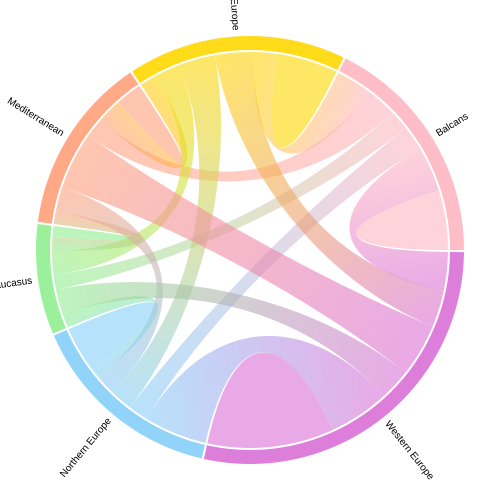

In [48]:
## Geographical blocks voting map
#Total points given by each geo group
geo_points = country_votes_df[country_votes_df['round']=='final'].groupby(
    ['from_country_group','to_country_group'], as_index=False)['total_points'].sum()

geo_points = geo_points[geo_points['from_country_group'] != 'wld']

#Adjacency Matrix
adj_mx = pd.pivot_table(geo_points,index=['from_country_group'], 
                        columns=['to_country_group'], values='total_points')
adj_mx_values = adj_mx.values

adj_mx_index = adj_mx.index

fig = ocd.Chord(adj_mx_values, adj_mx_index)
fig.show()

### ¿Se votan más los vecinos?

In [68]:
#Calculate distance between countries

def distance_btw_countries(country_a, country_b):
    """Calculate shortest distance beween two countries"""
    if (country_a in gdf_ne["country"].values) and (country_b in gdf_ne["country"].values):
        #Get country geometry
        country_a_geom = gdf_ne[gdf_ne["country"] == country_a]["geometry"].iloc[0]
        country_b_geom = gdf_ne[gdf_ne["country"] == country_b]["geometry"].iloc[0]
        #Find nearest points between borders 
        dot_a, dot_b = nearest_points(country_a_geom, country_b_geom)
        #Calculate distance between points
        distance = dot_a.distance(dot_b)
    else:
        distance = np.nan
    return distance

url = "./Data/world.geo.json"
gdf_ne = gpd.read_file(url)  # zipped shapefile
gdf_ne = gdf_ne[["name", 'geometry', 'continent', 'type']]
gdf_ne.columns = ["country", 'geometry', 'continent', 'type']

In [69]:
country_votes_dist_df = country_votes_filter_df[country_votes_filter_df['from_country'] != country_votes_filter_df['to_country']]
country_votes_dist_df.loc[:,'distance'] = country_votes_dist_df.apply(lambda row: distance_btw_countries(row['from_country_name'], row['to_country_name']), axis=1)
country_votes_dist_df = country_votes_dist_df.dropna(subset=['distance'])
country_votes_dist_df.head()

C:\Users\anaso\AppData\Local\Temp\ipykernel_6264\2990402344.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,from_country,to_country,total_points,from_country_name,to_country_name,overall_points_from,norm_points_from,pct_points_from,overall_points_to,norm_points_to,pct_points_to,distance
2,am,al,0,Armenia,Albania,1218,0.000000,0.000000,905,0.000000,0.000000,22.564084
3,at,al,28,Austria,Albania,3053,0.009171,0.917131,905,0.030939,3.093923,5.461578
4,au,al,0,Australia,Albania,870,0.000000,0.000000,905,0.000000,0.000000,112.083190
5,az,al,28,Azerbaijan,Albania,1276,0.021944,2.194357,905,0.030939,3.093923,23.800776
7,be,al,25,Belgium,Albania,3416,0.007319,0.731850,905,0.027624,2.762431,15.452720


In [70]:
#Filter Australia
country_votes_dist_df = country_votes_dist_df[country_votes_dist_df['from_country_name']!='Australia']
country_votes_dist_df = country_votes_dist_df[country_votes_dist_df['to_country_name']!='Australia']

#Scatter plot
distance_plot = alt.Chart(country_votes_dist_df).mark_circle(size=60, color=eurovision_palette[0]).encode(
        x=alt.X('distance:Q').title('Distance (degrees)'),
        y=alt.Y('pct_points_from:Q').title('Percentage of points given'),
        tooltip=['from_country_name', 'to_country_name', 'pct_points_from', 'distance']
    ).properties(
            width=800,
            height=400
    )

reg_line = distance_plot.transform_regression('distance', 'pct_points_from').mark_line(color=eurovision_palette[1], size=3)

distance_plot + reg_line

alt.LayerChart(...)

In [72]:
country_votes_dist_df

,from_country,to_country,total_points,from_country_name,to_country_name,overall_points_from,norm_points_from,pct_points_from,overall_points_to,norm_points_to,pct_points_to,distance
2,am,al,0,Armenia,Albania,1218,0.000000,0.000000,905,0.000000,0.000000,22.564084
3,at,al,28,Austria,Albania,3053,0.009171,0.917131,905,0.030939,3.093923,5.461578
5,az,al,28,Azerbaijan,Albania,1276,0.021944,2.194357,905,0.030939,3.093923,23.800776
7,be,al,25,Belgium,Albania,3416,0.007319,0.731850,905,0.027624,2.762431,15.452720
8,bg,al,11,Bulgaria,Albania,1102,0.009982,0.998185,905,0.012155,1.215470,1.845054
...,...,...,...,...,...,...,...,...,...,...,...,...
2354,ro,sk,0,Romania,Slovakia,1682,0.000000,0.000000,42,0.000000,0.000000,0.686344
2355,ru,sk,0,Russia,Slovakia,1566,0.000000,0.000000,42,0.000000,0.000000,4.848098
2356,se,sk,0,Sweden,Slovakia,3492,0.000000,0.000000,42,0.000000,0.000000,7.130167
2357,si,sk,0,Slovenia,Slovakia,2030,0.000000,0.000000,42,0.000000,0.000000,1.419155


In [257]:
#Filter Australia
country_votes_dist_df = country_votes_dist_df[country_votes_dist_df['from_country_name']!='Australia']
country_votes_dist_df = country_votes_dist_df[country_votes_dist_df['to_country_name']!='Australia']

#Select country group
country_votes_dist_df['from_country_group'] = country_votes_dist_df['from_country'].replace(country_group_mapping)
country_votes_dist_df = country_votes_dist_df.rename(columns={'from_country_group':'Region'})
selection = alt.selection_point(fields=['Region'], empty=True)
color = alt.condition(
    selection,
    alt.Color('Region:N', scale=alt.Scale(range=[eurovision_palette[3], eurovision_palette[1], eurovision_palette[2],
                                                 eurovision_palette[0],eurovision_palette[4], eurovision_palette[5]])).legend(None),
    alt.value('rgba(211, 211, 211, 0)')
)

#Scatter plot
distance_plot = alt.Chart(country_votes_dist_df).mark_circle(size=60).encode(
        x=alt.X('distance:Q').title('Distance (degrees)'),
        y=alt.Y('pct_points_from:Q').title('Percentage of points given'),
        color = color,
        tooltip=['from_country_name', 'to_country_name', 'pct_points_from', 'distance']
).properties(
            width=800,
            height=300,
            title='Do neighbors vote each other?'
    )

legend = alt.Chart(country_votes_dist_df).mark_point().encode(
    alt.Y('Region:N', title='Geographical region').axis(orient='right'),
    color=color
).add_params(
    selection
)

reg_line = distance_plot.transform_regression('distance', 'pct_points_from').mark_line(
    color='white', size=5)

distance_plot + reg_line | legend

c:\Users\anaso\anaconda3\lib\site-packages\altair\utils\data.py:230: UserWarning:

DataFrame columns are not unique, some columns will be omitted.



alt.HConcatChart(...)

### ¿Quién es el más popular?

In [258]:
#Average points recieved by country
points_country = (country_votes_df.groupby(['to_country', 'to_country_group'])['total_points'].sum() / country_votes_df.groupby(
    ['to_country', 'to_country_group']).size()).sort_values(ascending=False)
points_country = points_country.reset_index()
points_country.columns = ['Country','Region', 'Avg_points']

boxplot = alt.Chart(points_country).mark_boxplot(ticks={'color':'white'}, size=50, color='white').encode(
        x=alt.X("Region:N", axis=alt.Axis(labelAngle=-45)), 
        y=alt.Y("Avg_points:Q").title('Average points received per country'), 
        color = alt.Color("Region:N").scale(range=[eurovision_palette[3], eurovision_palette[1], eurovision_palette[2],
                                                 eurovision_palette[0],eurovision_palette[4], eurovision_palette[5]]).legend(None),
    ).properties(
        width=400, 
        height=300,
        title='Who is the most popular?'
    )

boxplot

alt.Chart(...)

In [259]:
(boxplot | distance_plot + reg_line| legend).configure_axis(
    labelFontSize=20,
    titleFontSize=20
).configure_legend(
titleFontSize=15,
labelFontSize=15, 
orient='bottom'
).configure_title(fontSize=24) 

c:\Users\anaso\anaconda3\lib\site-packages\altair\utils\data.py:230: UserWarning:

DataFrame columns are not unique, some columns will be omitted.

c:\Users\anaso\anaconda3\lib\site-packages\altair\utils\data.py:230: UserWarning:

DataFrame columns are not unique, some columns will be omitted.



alt.HConcatChart(...)

In [53]:
country_votes_df.groupby('to_country_group')['total_points'].sum()

to_country_group
Balcans                 28198
Eastern Europe          33804
Mediterranean           17534
Middle East-Caucasus    16055
Northern Europe         26646
Western Europe          38071
Name: total_points, dtype: int64

In [54]:
#Top regions (by average points given to countries in the group by each country)
top_regions = country_votes_df.groupby('to_country_group')['total_points'].sum() / country_votes_df.groupby('to_country_group').size()
top_regions = top_regions.reset_index()
top_regions.columns = ['Region', 'Avg_points']

# create a bar chart with a similar condition on the opacity encoding.
top_regions = (
    alt.Chart(
        top_regions, title="Top geographical regions"
    )
    .mark_bar(color=eurovision_palette[0])
    .encode(
        x=alt.X("Avg_points").title('Average points'),
        y=alt.Y("Region").sort("-x"),
    ).properties(
            width=300,
            height=150
    )
)

top_regions

alt.Chart(...)

### 2.3. What makes a song SO good?

### Features radar chart

At the moment it is not implemented in Vega, so we are going to use plotly for that

In [265]:
#Calculate the medium for each characteristic
features_df = songs_df[['energy', 'danceability', 'happiness', 'acousticness', 
                         'liveness', 'speechiness']].melt(
                            var_name='Feature', value_name='Value')
features_df = features_df.groupby('Feature',as_index=False)['Value'].mean()
features_df.head()

,Feature,Value
0,acousticness,21.372632
1,danceability,56.204211
2,energy,67.336842
3,happiness,44.000000
4,liveness,18.543158


In [268]:
fig = px.line_polar(features_df, r='Value', theta='Feature', line_close=True,
                    template = 'plotly_dark', color_discrete_sequence = eurovision_palette)
fig.update_traces(fill='toself')
fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[0, 80]
    )),
  showlegend=False,
  width=600,
  height=400,
  font=dict(
        size=20
))
fig.show()

c:\Users\anaso\anaconda3\lib\site-packages\plotly\express\_core.py:271: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



### Lyrics Wordcloud

In [260]:
from ipywidgets import widgets, interact, interactive, fixed, Button, Layout
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
#import spacy
import nltk
from nltk.corpus import stopwords
from IPython.display import display
# Download NLTK resources
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('words')
nltk.download('wordnet')
nltk.download('omw-1.4')
from nltk.tokenize import word_tokenize

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\anaso\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\anaso\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\anaso\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\anaso\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\anaso\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [261]:
# Define stopwords for multiple languages 
stop_words = set(stopwords.words())
# Function to remove stopwords
def remove_stopwords(text):
    tokens = word_tokenize(text)
    filtered_tokens = [word for word in tokens if word.lower() not in stop_words]
    return ' '.join(filtered_tokens)

# Function to lemmatize text
def lemmatize(text):
    lemmatizer = nltk.stem.WordNetLemmatizer()
    lemmatized_text = [lemmatizer.lemmatize(word) for word in text.split()]
    return ' '.join(lemmatized_text)

# Function to clean sentences
def clean_sent(text):
    return ' '.join([word for word in text.split() if len(word) > 1])

In [273]:
def full_cleaning(frame,col):
    newframe=frame.copy()  
    newframe[col] = newframe[col].str.replace('\d+', '',regex=True).str.replace('?', '', regex=True
        ).str.replace('\W', ' ', regex=True).str.replace("\n", '', regex=True
        ).str.replace('\b(n\w+)\b', '', regex=True).str.lower().str.strip()
    newframe = newframe.astype('str')
    text = ' '.join(newframe[col][:])
    cleantext = remove_stopwords(text)
    words = set(nltk.corpus.words.words())
    cleantext=lemmatize(cleantext) 
    cleantext = clean_sent(cleantext)
    return cleantext

def color_wordcloud(word, font_size, position,orientation,random_state=None, **kwargs):
    random_color = np.random.choice(eurovision_palette[:-4])
    return random_color

def makingclouds(frame,col,maximum):
    cloudtext=full_cleaning(frame,col)
    wordcloud = WordCloud(max_font_size=50, max_words=maximum, background_color="black",collocations=False, 
        font_path='calibri.ttf').generate(cloudtext)
    #wordcloud.generate_from_frequencies
    plt.style.use("seaborn-white")
    plt.figure()
    plt.imshow(wordcloud.recolor(color_func=color_wordcloud), interpolation="bilinear")
    plt.axis("off")
    
    plt.show()  # Display the plot


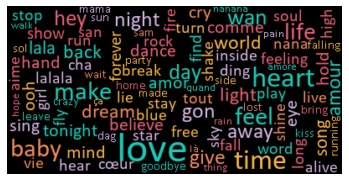

In [274]:
makingclouds(contestants_df[['lyrics']],col='lyrics', maximum=100)

### Piecharts

In [61]:
songs_df.groupby('gender').size().reset_index()

,gender,0
0,Female,274
1,Male,244
2,Mix,47


In [62]:
songs_df.columns[0]

'year'

In [283]:
counts_df = songs_df.groupby('gender').size().reset_index()
counts_df.columns = [counts_df.columns[0], 'count']
gender_plot = alt.Chart(counts_df).mark_arc().encode(
        theta="count",
        color=alt.Color("gender",scale=alt.Scale(range=eurovision_palette)).title('Gender'),
        tooltip=['gender', 'count']
    ).properties(
        title='Main singer(s) gender'
    ).configure_axis(
    labelFontSize=20,
    titleFontSize=20
).configure_legend(
titleFontSize=15,
labelFontSize=15
).configure_title(fontSize=24) 
gender_plot

alt.Chart(...)

In [284]:
counts_df = songs_df.groupby('style').size().sort_values().reset_index()
counts_df.columns = [counts_df.columns[0], 'count']
style_plot = alt.Chart(counts_df).mark_arc().encode(
        theta=alt.Theta("count:Q", sort='ascending'),
        color=alt.Color("style:N", scale=alt.Scale(range=eurovision_palette)).title('Style'),
        tooltip=['style', 'count']
        ).properties(
        title='Music style'
    ).configure_axis(
    labelFontSize=20,
    titleFontSize=20
).configure_legend(
titleFontSize=15,
labelFontSize=15
).configure_title(fontSize=24) 
style_plot

alt.Chart(...)

In [286]:
counts_df = songs_df.groupby('backing_dancers').size().sort_values().reset_index()
counts_df.columns = [counts_df.columns[0], 'count']
dancers_plot = alt.Chart(counts_df).mark_arc().encode(
        theta=alt.Theta("count:Q", sort='ascending'),
        color=alt.Color("backing_dancers:Q").scale(range=eurovision_cont_palette, reverse=True).title('Number'),
        tooltip=['backing_dancers', 'count']
        ).properties(
            title='Backing dancers'
        )
dancers_plot

alt.Chart(...)

In [287]:
counts_df = songs_df.groupby('backing_singers').size().sort_values().reset_index()
counts_df.columns = [counts_df.columns[0], 'count']
singers_plot = alt.Chart(counts_df).mark_arc().encode(
        theta=alt.Theta("count:Q", sort='ascending'),
        color=alt.Color("backing_singers:Q").scale(range=eurovision_cont_palette, reverse=True).title('Number'),
        tooltip=['backing_singers', 'count']
        ).properties(
            title='Backing singers'
        )
singers_plot

alt.Chart(...)

In [288]:
counts_df = songs_df.groupby('backing_instruments').size().sort_values().reset_index()
counts_df.columns = [counts_df.columns[0], 'count']
instruments_plot = alt.Chart(counts_df).mark_arc().encode(
        theta=alt.Theta("count:Q", sort='ascending'),
        color=alt.Color("backing_instruments:Q").scale(range=eurovision_cont_palette, reverse=True).title('Number'),
        tooltip=['backing_instruments', 'count']
        ).properties(
            title='Backing instruments'
        )
instruments_plot

alt.Chart(...)

In [289]:
alt.hconcat(singers_plot, dancers_plot, instruments_plot).configure_axis(
    labelFontSize=20,
    titleFontSize=20
).configure_legend(
titleFontSize=15,
labelFontSize=15
).configure_title(fontSize=24) 

alt.HConcatChart(...)

### 2.4. Voting in Eurovision (2016-2023)

### Suelen acertar las apuestas?

In [126]:
#Get only songs that got into the final
bets_rank_df = bets_df[bets_df['contest_round']=='final'].merge(contestants_df[['year','to_country', 'place_contest', 'points_final']], how='left',
left_on=['year','country_name'], right_on=['year','to_country'])
bets_rank_df = bets_rank_df[bets_rank_df['place_contest'].notnull()]
bets_rank_df['country_group'] = bets_rank_df['country_code'].replace(country_group_mapping)

bets_rank_df.head()

,betting_bm_id,betting_sc_id,betting_name,betting_score,year,performer,song,page_url,contest_round,country_name,country_code,to_country,place_contest,points_final,points_tele_final,points_jury_final,country_group
0,5,220,BET365,2.10,2015-01-01,Måns Zelmerlöw,Heroes,/eurovision/2015/sweden,final,Sweden,Sweden,Sweden,1.0,365.0,NaN,NaN,Sweden
1,4,153,UNIBET,2.00,2015-01-01,Måns Zelmerlöw,Heroes,/eurovision/2015/sweden,final,Sweden,Sweden,Sweden,1.0,365.0,NaN,NaN,Sweden
2,18,139,YOUWIN,2.38,2015-01-01,Måns Zelmerlöw,Heroes,/eurovision/2015/sweden,final,Sweden,Sweden,Sweden,1.0,365.0,NaN,NaN,Sweden
3,15,131,BOYLESPORTS,2.25,2015-01-01,Måns Zelmerlöw,Heroes,/eurovision/2015/sweden,final,Sweden,Sweden,Sweden,1.0,365.0,NaN,NaN,Sweden
4,21,124,CORAL,2.10,2015-01-01,Måns Zelmerlöw,Heroes,/eurovision/2015/sweden,final,Sweden,Sweden,Sweden,1.0,365.0,NaN,NaN,Sweden


In [379]:
mean_odds_df = bets_rank_df.groupby(['year', 'country_name', 'place_contest']).agg({'betting_score': 'mean'}).reset_index()

# Define the selection
selection = alt.selection_point(fields=['country_name'], bind='legend')

# Create the scatter plot using Altair
scatter_plot = alt.Chart(mean_odds_df).mark_circle(size=60).encode(
    x=alt.X('betting_score:Q').title('Mean betting score'),
    y=alt.Y('place_contest:O').title('Place in the contest'),
    color=alt.Color('country_name:N',scale=alt.Scale(range=eurovision_palette)).title('Country name'),
    tooltip=['year', 'country_name', 'betting_score']
).properties(
    title='Mean Betting Odds vs Final Position (by Country and Year)'
).properties(
    width=600,
    height=400
).add_selection(
    selection
).transform_filter(
    selection
)
# Show the plot
scatter_plot 

c:\Users\anaso\anaconda3\lib\site-packages\altair\utils\deprecation.py:65: AltairDeprecationWarning:

'add_selection' is deprecated. Use 'add_params' instead.



alt.Chart(...)

In [125]:
mean_odds_df = bets_rank_df.groupby(['year', 'country_name', 'points_final']).agg({'betting_score': 'mean'}).reset_index()

# Define the selection
selection = alt.selection_point(fields=['country_name'], bind='legend')

# Create the scatter plot using Altair
scatter_plot = alt.Chart(mean_odds_df).mark_circle(size=60).encode(
    x=alt.X('betting_score:Q').title('Mean betting score'),
    y=alt.Y('points_final:Q').title('Place in the contest'),
    color=alt.Color('country_name:N',scale=alt.Scale(range=eurovision_palette)).title('Country name'),
    tooltip=['year', 'country_name', 'betting_score']
).properties(
    title='Mean Betting Odds vs Final Position (by Country and Year)'
).properties(
    width=600,
    height=400
).add_selection(
    selection
).transform_filter(
    selection
)
# Show the plot
scatter_plot 

c:\Users\anaso\anaconda3\lib\site-packages\altair\utils\deprecation.py:65: AltairDeprecationWarning:

'add_selection' is deprecated. Use 'add_params' instead.



alt.Chart(...)

In [132]:
#Get only songs that got into the final
bets_rank_df = bets_df[bets_df['contest_round']=='final'].merge(contestants_df[['year','to_country', 'place_contest', 'points_final', 'points_tele_final', 'points_jury_final']], how='left',
left_on=['year','country_name'], right_on=['year','to_country'])
bets_rank_df = bets_rank_df[bets_rank_df['place_contest'].notnull()]
bets_rank_df = bets_rank_df[bets_rank_df['points_tele_final'].notnull()]
bets_rank_df['country_group'] = bets_rank_df['country_code'].replace(country_group_mapping)
bets_points_df = pd.melt(bets_rank_df, id_vars=['country_name','betting_name', 'betting_score', 'year'], value_vars=['points_tele_final', 'points_jury_final'],
    var_name='type', value_name='points',)

bets_points_df.head()

,country_name,betting_name,betting_score,year,type,points
0,Russia,BET365,1.90,2016-01-01,points_tele_final,361.0
1,Russia,BETFAIRSPORT,1.40,2016-01-01,points_tele_final,361.0
2,Russia,STANJAMES,1.53,2016-01-01,points_tele_final,361.0
3,Russia,BOYLESPORTS,1.40,2016-01-01,points_tele_final,361.0
4,Russia,SPORTINGBET,1.30,2016-01-01,points_tele_final,361.0


In [293]:
mean_odds_df = bets_points_df.groupby(['year', 'country_name', 'type', 'points']).agg({'betting_score': 'mean'}).reset_index()

# Define the selection
selection = alt.selection_point(fields=['type'], bind='legend')

# Create the scatter plot using Altair
scatter_plot = alt.Chart(mean_odds_df).mark_circle(size=60).encode(
    x=alt.X('betting_score:Q').title('Mean betting score'),
    y=alt.Y('points:Q').title('Points in the final'),
    color=alt.Color('type:N',scale=alt.Scale(range=eurovision_palette)).title('Type of votes'),
    tooltip=['year', 'country_name', 'betting_score']
).properties(
    title='Mean Betting Odds vs Points received (by Country and Year)'
).properties(
    width=600,
    height=400
).add_selection(
    selection
).transform_filter(
    selection
)
# Show the plot
scatter_plot.configure_axis(
    labelFontSize=20,
    titleFontSize=20
).configure_legend(
titleFontSize=15,
labelFontSize=15
).configure_title(fontSize=24)  

c:\Users\anaso\anaconda3\lib\site-packages\altair\utils\deprecation.py:65: AltairDeprecationWarning:

'add_selection' is deprecated. Use 'add_params' instead.



alt.Chart(...)

### ¿Suelen coincidir Jurado y Público?

Here we could include a bar filter to select the contest place and another selector for the year 

In [308]:
votes_df = contestants_df[
    contestants_df.year.dt.year >= 2016][['year', 'to_country', 'points_jury_final', 'points_tele_final', 'place_contest']].dropna()
votes_df.columns = ['year', 'country', 'points_jury_final', 'points_tele_final', 'place_contest']
votes_df['year'] = votes_df['year'].astype('str')

#Scatter plot
scatter = alt.Chart(votes_df).mark_circle(size=60).encode(
    x=alt.X('points_jury_final').title('Points Jury'),
    y=alt.Y('points_tele_final').title('Points Televote'),
    #color='year',
    color = alt.Color('place_contest').scale(range=eurovision_cont_palette, reverse=True).title('Place in final'),
    tooltip=['year', 'country', 'points_jury_final', 'points_tele_final', 'place_contest']
)


scatter.configure_axis(
    labelFontSize=20,
    titleFontSize=20
).configure_legend(
titleFontSize=15,
labelFontSize=15
).configure_title(fontSize=24)   

alt.Chart(...)

### ¿Influye si cantas en la primera o última mitad?

In [295]:
#Drops songs that didn't participate in the final
finalists_df = contestants_df[~contestants_df['running_final'].isna()]

#Select data from 2016 to 2023
finalists_df = finalists_df[finalists_df['year'].dt.year >= 2016]

#Determine if they performed in the first or second half
finalists_df['final_half'] = pd.cut(finalists_df['running_final'], bins=[0, 14, 27], labels=['1st', '2nd'], right=False)


In [296]:
finalists_df['final_half'].value_counts()

1st    91
2nd    90
Name: final_half, dtype: int64

In [297]:
alt.Chart(finalists_df).mark_bar(
    opacity=0.3,
    binSpacing=0
).encode(
    alt.X('points_tele_final:Q').bin(maxbins=20),
    alt.Y('count()').stack(None),
    alt.Color('final_half:N')
)

alt.Chart(...)

In [298]:
hist_tele = alt.Chart(finalists_df).mark_bar(
        opacity=0.3,
        binSpacing=0
    ).encode(
        alt.X('points_tele_final:Q').bin(maxbins=20),
        alt.Y('count()').stack(None),
        alt.Color('final_half:N')
    )

hist_jury = alt.Chart(finalists_df).mark_bar(
        opacity=0.3,
        binSpacing=0
    ).encode(
        alt.X('points_jury_final:Q').bin(maxbins=20),
        alt.Y('count()').stack(None),
        alt.Color('final_half:N')
    )

hist_tele | hist_jury

alt.HConcatChart(...)

In [299]:
dist_tele = alt.Chart(finalists_df).transform_density(
        'points_tele_final',
        as_=['points_tele_final', 'density'],
        groupby=['final_half']
    ).mark_area().encode(
        x="points_tele_final:Q",
        y='density:Q',
        color = alt.Color('final_half:N')
    ).resolve_scale(y='independent')

dist_jury = alt.Chart(finalists_df).transform_density(
        'points_jury_final',
        as_=['points_jury_final', 'density'],
        groupby=['final_half']
    ).mark_area().encode(
        x="points_jury_final:Q",
        y='density:Q',
        color = alt.Color('final_half:N')
    ).resolve_scale(y='independent')

dist_tele | dist_jury

alt.HConcatChart(...)

In [300]:
points_df = finalists_df[['final_half','points_tele_final', 'points_jury_final']]
points_df.columns = ['final_half', 'Televote', 'Jury']
points_half = pd.melt(points_df, 
            id_vars='final_half', value_vars=['Televote', 'Jury'],
            var_name='voting_type', value_name='points')

boxplot = alt.Chart(points_half).mark_boxplot(ticks={'color':'white'}, size=50, color='white').encode(
        x=alt.X("final_half:O", title=None, axis=alt.Axis(labels=False, ticks=False), scale=alt.Scale(padding=1)), 
        y=alt.Y("points:Q").title('Points'), 
        color=alt.Color("final_half:N", scale=alt.Scale(range=eurovision_palette)).title('Final half'),
        column=alt.Column('voting_type:N', header=alt.Header(orient='bottom')).title('Voting type')
    ).properties(
        width=200, 
        height=300
    ).configure_facet(
        spacing=-100
    ).configure_view(
        stroke=None
    )


boxplot.configure_axis(
    labelFontSize=20,
    titleFontSize=20
).configure_legend(
titleFontSize=15,
labelFontSize=15
).configure_title(fontSize=24)   

alt.Chart(...)

In [243]:
from scipy.stats import mannwhitneyu
print(mannwhitneyu(points_df[points_df['final_half']=='1st']['Televote'], 
               points_df[points_df['final_half']=='2nd']['Televote']))
print(mannwhitneyu(points_df[points_df['final_half']=='1st']['Jury'], 
               points_df[points_df['final_half']=='2nd']['Jury']))

MannwhitneyuResult(statistic=3559.5, pvalue=0.12898028369912448)
MannwhitneyuResult(statistic=4355.5, pvalue=0.46065757395552553)


In [311]:
points_df = finalists_df[['final_half','points_tele_final', 'points_jury_final']]
points_df.columns = ['final_half', 'Televote', 'Jury']
points_half = pd.melt(points_df, 
            id_vars='final_half', value_vars=['Televote', 'Jury'],
            var_name='voting_type', value_name='points')

boxplot = alt.Chart(points_half).mark_boxplot(ticks={'color':'white'}, size=50, color='white').encode(
        x=alt.X("voting_type:O", title=None, axis=alt.Axis(labels=False, ticks=False), scale=alt.Scale(padding=1)), 
        y=alt.Y("points:Q").title('Points'), 
        color=alt.Color("voting_type:N", scale=alt.Scale(range=eurovision_palette)).title('Voting type'),
        column=alt.Column('final_half:N', header=alt.Header(orient='bottom')).title('Final half')
    ).properties(
        width=200, 
        height=300
    ).configure_facet(
        spacing=0
    ).configure_view(
        stroke=None
    )


boxplot.configure_axis(
    labelFontSize=20,
    titleFontSize=20
).configure_legend(
titleFontSize=15,
labelFontSize=15
).configure_title(fontSize=24)   

alt.Chart(...)

In [142]:
from scipy.stats import mannwhitneyu
print(mannwhitneyu(points_df[points_df['final_half']=='1st']['Televote'], 
               points_df[points_df['final_half']=='1st']['Jury']))
print(mannwhitneyu(points_df[points_df['final_half']=='2nd']['Jury'], 
               points_df[points_df['final_half']=='2nd']['Televote']))

MannwhitneyuResult(statistic=3378.5, pvalue=0.03210849233614109)
MannwhitneyuResult(statistic=3954.0, pvalue=0.7846689043262632)


### Most voted countries

In [309]:
votes_df.columns

Index(['year', 'country', 'points_jury_final', 'points_tele_final',
       'place_contest'],
      dtype='object')

In [310]:
total_points_country = votes_df.groupby(['country'], as_index=False)[['points_jury_final', 'points_tele_final']].sum()
# create a bar chart with a ranking
ranking_jury = (
    alt.Chart(total_points_country).mark_bar(color = eurovision_palette[0]).encode(
        x=alt.X("points_jury_final").title('Points'),
        y=alt.Y("country").title('Country').sort("-x"),
    ).transform_window(
    rank='rank(points_jury_final)',
    sort=[alt.SortField('points_jury_final', order='descending')]
).transform_filter(
    alt.datum.rank <= 10).properties(
        width=300,
        height=250,
        title="Most voted by Jury"
    )
)

ranking_tele = (
    alt.Chart(total_points_country).mark_bar(color = eurovision_palette[1]).encode(
        x=alt.X("points_tele_final").title('Points'),
        y=alt.Y("country").title('Country').sort("-x"),
    ).transform_window(
    rank='rank(points_tele_final)',
    sort=[alt.SortField('points_tele_final', order='descending')]
).transform_filter(
    alt.datum.rank <= 10).properties(
        width=300,
        height=250,
        title="Most voted by Televote"
    )
)

alt.hconcat(ranking_jury,ranking_tele).configure_axis(
    labelFontSize=20,
    titleFontSize=20
).configure_legend(
titleFontSize=15,
labelFontSize=15
).configure_title(fontSize=24)   

alt.HConcatChart(...)